In [1]:
!pip install kaggle

     |████████████████████████████████| 58 kB 828 kB/s eta 0:00:011
     |████████████████████████████████| 78 kB 1.0 MB/s  eta 0:00:01
  Created wheel for kaggle: filename=kaggle-1.5.12-py3-none-any.whl size=73051 sha256=04b2fa77dd043e50355c8a1e3ab0c7747c95cf3babe223b619686428209a69e8
  Stored in directory: /home/pranay/.cache/pip/wheels/29/da/11/144cc25aebdaeb4931b231e25fd34b394e6a5725cbb2f50106
Successfully built kaggle


Use this reference of how to download Kaggle datasets

"https://www.analyticsvidhya.com/blog/2021/04/how-to-download-kaggle-datasets-using-jupyter-notebook/""

In [4]:
!pip install opendatasets

  Using cached click-8.0.3-py3-none-any.whl (97 kB)


In [5]:
import opendatasets as od

In [6]:
od.download('https://www.kaggle.com/drgfreeman/rockpaperscissors')

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: pranaytiwari
Your Kaggle Key: ········


100%|████████████████████████████████████████| 306M/306M [00:11<00:00, 27.6MB/s]


Once the download is complete, you should have a folder structure that looks like this:
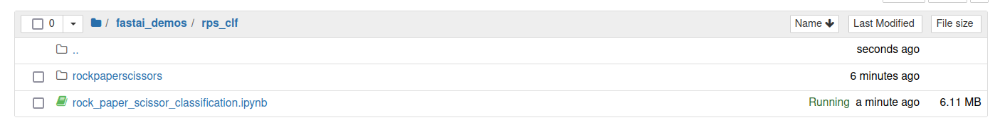

The images are in 3 separate folders inside the rockpaperscissors directory as shown below: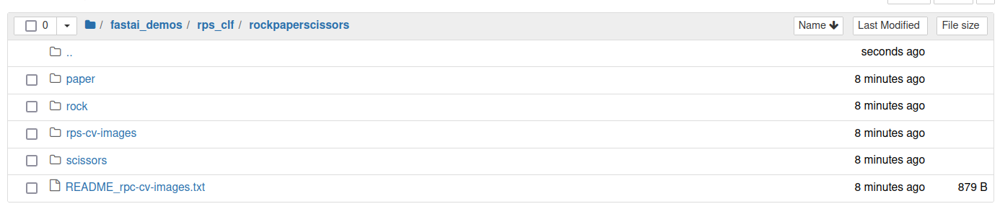

In [1]:
#hide
# !pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

In [7]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [8]:
import os
os.getcwd()

'/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf'

In [9]:
os.listdir()

['.ipynb_checkpoints',
 'rockpaperscissors',
 'rock_paper_scissor_classification.ipynb']

In [10]:
path = Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors')

In [11]:
fns = get_image_files(path)

In [12]:
fns

(#4376) [Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/HU7Q4utMI0vHMxlh.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/04l5I8TqdzF9WDMJ.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0a3UtNzl5Ll3sq8K.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0cb6cVL8pkfi4wF6.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0eqArS2GgsBeqgSn.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0Og76sl5CJhbxWWx.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0RA9rcrv8iVvuDDU.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0t08v9bAaA0mXGCQ.png'),Path('/media/pranay/DATA/repos/fastai/fastai_demos/rps_clf/rockpaperscissors/paper/0Uomd0HvOB33m47I.png'),Path('/media/pranay/DATA/repos/fastai

In [13]:
failed = verify_images(fns)
failed

(#0) []

In [14]:
failed.map(Path.unlink)

(#0) []

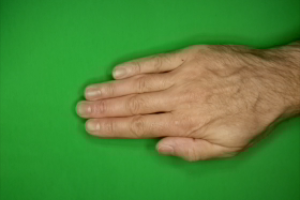

In [24]:
Image.open(fns[0])

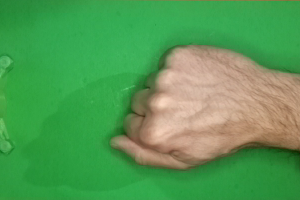

In [25]:
Image.open(fns[890])

In [18]:
rps = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In FastAI, a DataBlock is basically a blueprint of how you will assemble data. By itself it does nothing, you would have to add additional information about features, labels how to split the data into training and validation.

In [19]:
dls = rps.dataloaders(path)

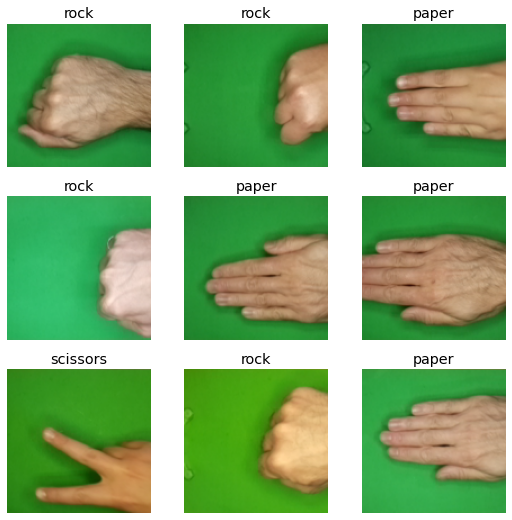

In [20]:
dls.show_batch()

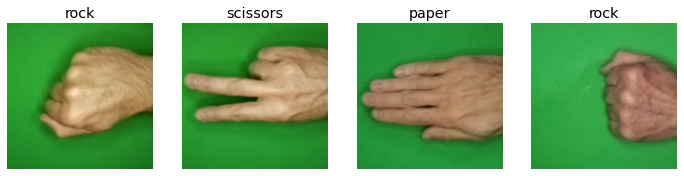

In [26]:
dls.valid.show_batch(max_n=4, nrows=1)

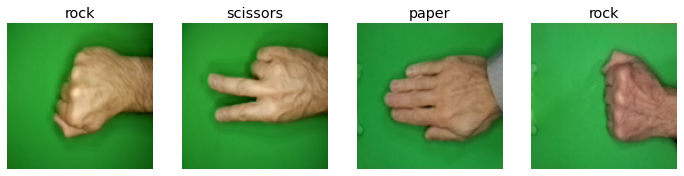

In [28]:
rps = rps.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = rps.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

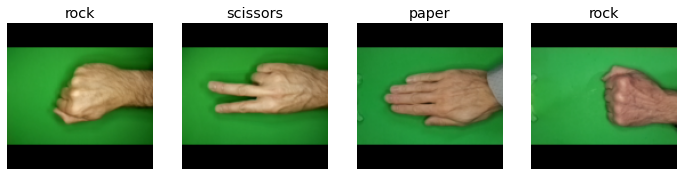

In [29]:
rps = rps.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = rps.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

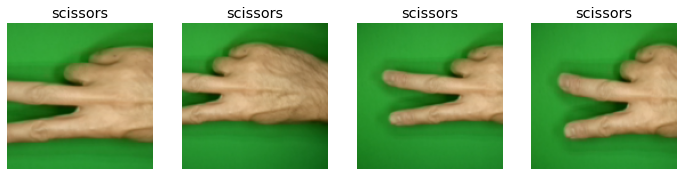

In [31]:
rps = rps.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = rps.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

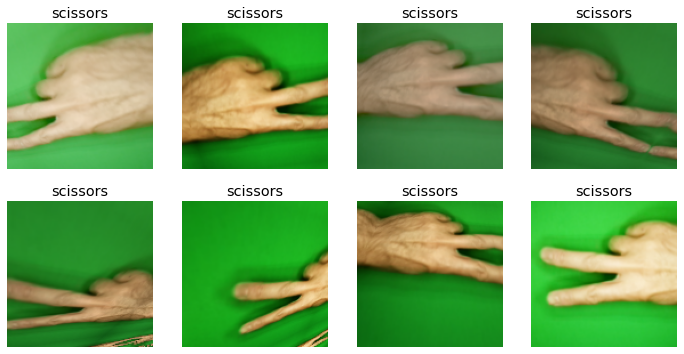

In [32]:
rps = rps.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = rps.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training on the rock papers scissors data

In [33]:
rps = rps.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = rps.dataloaders(path)

In [34]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,0.380823,0.092442,0.027429,04:58


epoch,train_loss,valid_loss,error_rate,time
0,0.051294,0.007519,0.001143,07:06
1,0.050584,0.003836,0.001143,07:04
2,0.038333,0.004308,0.001143,07:02
3,0.023157,0.001322,0.001143,07:01
4,0.017735,0.001803,0.001143,06:57


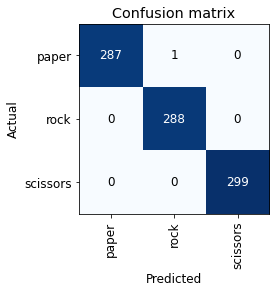

In [35]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [37]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
#hide
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

### Using the Model for Inference

In [38]:
learn.export()

In [39]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [41]:
learn_inf = load_learner(path/'export.pkl')

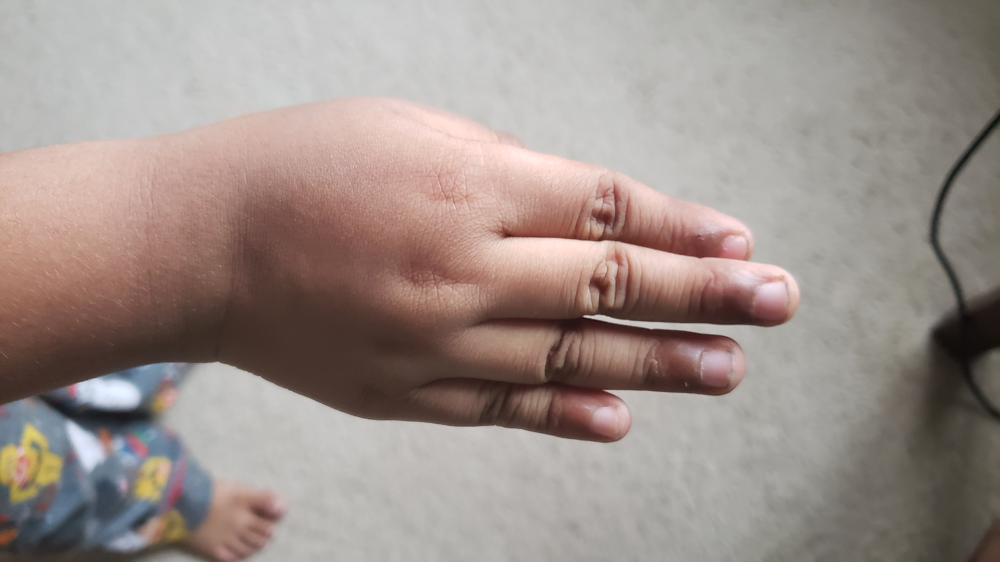

In [44]:
Image.open('test_images/paper.jpg')

In [42]:
learn_inf.predict('test_images/paper.jpg')

('paper', tensor(0), tensor([9.9936e-01, 6.2626e-04, 1.0282e-05]))

In [43]:
learn_inf.dls.vocab

['paper', 'rock', 'scissors']

### Creating a Notebook App from the Model

In [45]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [59]:

btn_upload = SimpleNamespace(data = ['test_images/rock.jpg'])

In [60]:
img = PILImage.create(btn_upload.data[-1])

In [61]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(400,400))
out_pl

Output()

In [62]:
pred,pred_idx,probs = learn_inf.predict(img)

In [63]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: rock; Probability: 0.9920')

In [64]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [65]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(400,400))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [66]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [67]:
VBox([widgets.Label('Select your rock_or_paper_or_scissor!'), 
      btn_upload, btn_run, out_pl, lbl_pred])